# Algotytm przecinania się odcinków na płaszczyźnie

In [15]:
import numpy as np
import pandas as pd
import matplotlib
from bitalg.tests.test4 import Test
from bitalg.visualizer.main import Visualizer

# Przydatne funkcje 

In [2]:
def draw_example_1():
    # TODO narysowac to uzywając naszego narzędzia do wizualizacji
    vis = Visualizer()
    line_segments = ((-0.5, 0.5), (8.5, 3.5),
                     (1, 3), (7, 5),
                     (2, 4), (5, 1),
                     (4.5, 3), (6.5, 6),
                     (0, 5), (5.5, 5.5))

    vis.add_line_segment(line_segments)
    vis.show()
    
def draw_example_2():
    # TODO narysowac to uzywając naszego narzędzia do wizualizacji
    vis = Visualizer()
    line_segments = ((-0.5, 0.5), (8.5, 3.5),
                     (1, 3), (7, 5),
                     (2, 4), (5, 1),
                     (4.5, 3), (6.5, 6),
                     (0, 5), (5.5, 5.5))
    points = [(4, 2),
              (2.5, 3.5),
              (5.5, 4.5)]

    vis.add_line_segment(line_segments)
    vis.add_point(points, color='red')
    vis.show()


### Wprowadzenie
Celem ćwiczenia jest implementacja i zapoznanie się z algorytmem wyznaczającym wszystkie przecięcia się odcinków na płaszczyźnie

### Przykładowy zbiór odcinków przed wyznaczeniem punktów przecięcia

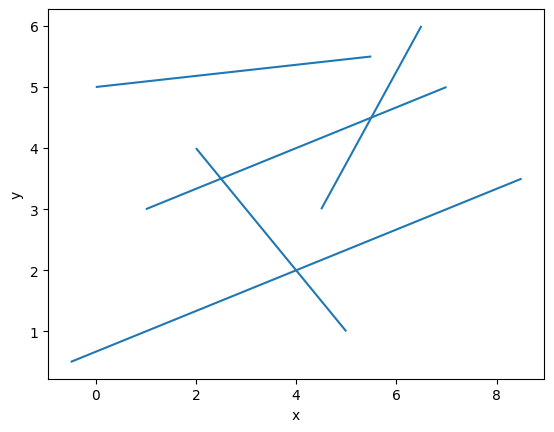

In [3]:
draw_example_1()

### Przykładowy zbiór odcinków po wyznaczenu punktów przecięcia

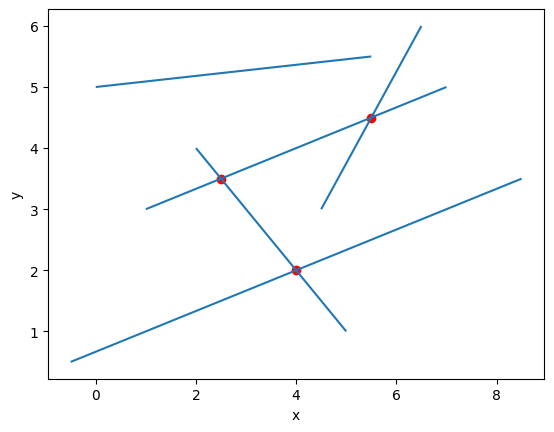

In [4]:
draw_example_2()

# Generowanie losowych odcinków na płaszczyźnie

Uzupełnij funkcję ```generate_uniform_sections```

In [2]:
def generate_uniform_sections(max_x, max_y, n):
    """
    Funkcja generuje odcinki o współrzędnych rzeczywistych w postaci par punktów. 
    Żaden wygenerowany odcinek nie jest odcinkiem pionowym.
    Żadne dwa odcinki nie mają swoich końców o takiej samej współrzędnej x.
    Zakres współrzędnych: x -> (0, max_x), y -> (0, max_y)
    :param max_x: określa maksymalną wartość współrzednej x jaka może zostać wylosowana
    :param max_y: określa maksymalną wartość współrzednej y jaka może zostać wylosowana
    :param n: ilość generowanych odcinków
    :return: tablica odcinków w postaci krotek zawierających parę krotek współrzędnych punktów końcowych odcinków
    np. [((x1, y1), (x2, y2)), ((x3, y3), (x4, y4)),...]
    """
    sections = []
    for i in range(n):
        x1 = np.random.uniform(0,max_x,1)[0]
        y1 = np.random.uniform(0,max_y,1)[0]
        x2 = np.random.uniform(0,max_x,1)[0]
        y2 = np.random.uniform(0,max_y,1)[0]
        sections.append(((x1,y1),(x2,y2)))
    return sections

In [6]:
Test().runtest(1, generate_uniform_sections)

Lab 4, task 1:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
Result: 3/3
Time: 0.125s


<span style="color:red">Ćw.</span> Wygeneruj $\large20$ losowych odcinków w przestrzeni 2D o współrzędnych z przedziału $\large x \in \langle 0,1000 \rangle$ oraz $\large y \in \langle 0,1000\rangle$. 

In [7]:
section = generate_uniform_sections(1000,1000,20)

Zwizualizuj otrzymane odcinki

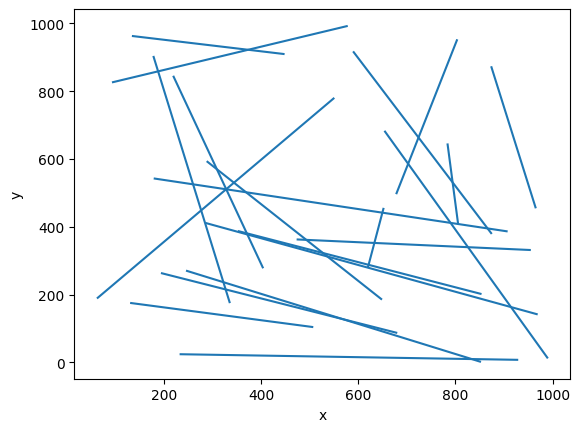

In [8]:
vis = Visualizer()
for i in section:
    vis.add_line_segment(i)
vis.show()

Uzupełnij funkcję ```add_sections``` #interaktywne dodawanie odcinków przez rysowanie myszką (jak?) TODO

In [9]:
import matplotlib.pyplot as plt

def add_sections(sections):   
    segments = []
    lines = None
    flag = False
    part_segment = None

    def onclick(event):
        nonlocal segments,lines,sections,flag,part_segment
        if event.button == 1 and len(segments) < sections:
            x,y = event.xdata,event.ydata
            if not flag:
                part_segment = (x,y)
                ax.scatter(x, y,color='b',marker='o')
                plt.draw()
                flag = True
            else:
                ax.plot((part_segment[0],x), (part_segment[1],y), marker='o', linestyle='-', color='b')
                segments.append((part_segment,(x,y)))
                plt.draw()
                flag = False

        elif event.button == 3:  
            fig.canvas.mpl_disconnect(cid)
            plt.close()

    # Tworzenie wykresu
    fig, ax = plt.subplots()
    ax.set_xlim((0,1000))
    ax.set_ylim((0,1000))
    ax.set_title("Stwórz " + str(sections) +" odcinków")

    # Dodanie obserwatora zdarzeń kliknięcia myszy
    cid = fig.canvas.mpl_connect('button_press_event', onclick)
    plt.show()
    return segments  


Uzupełnij funkcję ```is_intersection```

In [46]:
class BST:
    def __init__(self, key, idx, parent = None, left = None, right = None):
        self.left   = left
        self.right  = right 
        self.parent = parent
        self.key    = key
        self.idx    = idx  


def computeValue(pointA, pointB, x):
    ax, ay = pointA
    bx, by = pointB 

    slope = (by - ay) / (bx - ax) 
    intercept = ay - ax * slope 
    return slope * x + intercept 

def line_value(pointA, pointB, x):
    coeA= (pointB[1] - pointA[1]) / (pointB[0] - pointA[0]) 
    coeB = pointA[1] - pointA[0] * coeA 

    return coeA * x + coeB 


def Insert(root, segment, idx, x):
    pointA, pointB = segment 
    first = root 
    
    if root == None: 
        root = BST( segment, idx )
        return root, root

    while root != None:
        parent = root 
        if line_value(root.key[0], root.key[1], x) < line_value(pointA, pointB, x): 
            root = root.right 
        else: 
            root = root.left 

    root = BST( segment, idx )
    root.parent = parent 

    if line_value(pointA, pointB, x) < line_value(parent.key[0], parent.key[1], x):
        parent.left = root 
    else:
        parent.right = root 

    return first, root

# def Search(root, segment, x):
#     pointA, pointB = segment

#     if root == None:
#         return None
#     if root.key == (pointA, pointB): 
#             return root
#     if line_value(root.key[0], root.key[1], x) < line_value(pointA, pointB, x):
#         return Search(root.right,segment,x)
#     else: 
#         return Search(root.left,segment,x)

def Search(root, segment, x):
    pointA, pointB = segment

    while root != None:
        if root.key == (pointA, pointB): return root

        if computeValue(root.key[0], root.key[1], x) < computeValue(pointA, pointB, x):
            root = root.right 
        else:
            root = root.left 

    return None 




def Min(x):
    while x.left: 
        x = x.left 
    return x

def Max(x):
    while x.right:
        x = x.right 
    return x 

def Next_Node(root, segment, x): 
    pointA, pointB = segment 

    if root is None: return root
    next = None 

    while root is not None: 
        if root.key == (pointA, pointB):
            if root.right is not None:
                return Min( root.right )
            return next

        if line_value(root.key[0], root.key[1], x) > line_value(pointA, pointB, x):
            next = root 
            root = root.left 

        else:
            root = root.right 
        
    return next

def Prev_Node(root, segment, x): 
    pointA, pointB = segment 
    
    if root is None: return root 
    prev = None 

    while root is not None:
        if root.key == (pointA, pointB): 
            if root.left is not None:
                return Max( root.left )
            return prev
        
        if line_value(root.key[0], root.key[1], x) > line_value(pointA, pointB, x):
            root = root.left

        else:
            prev = root 
            root = root.right 
        
    return prev

def Successor2(x):
    return Min( x.right )

def Predecessor2(x):
    return Max( x.left )

def Remove(root, segment, val):
    pointA, pointB = segment
    parent = None 
    x = root 

    while x and x.key != segment:
        parent = x 

        if line_value(pointA, pointB, val) < line_value(x.key[0], x.key[1], val):
            x = x.left 
        else:
            x = x.right 


    if x is None:
        return root  

    if x.left is None and x.right is None:
        if x != root:
            if parent.left == x:
                parent.left = None 
            else:
                parent.right = None 
        else:
            root = None 
        
    elif x.left and x.right:
        succ = Successor2(x)
        Remove(x, succ.key, val)
        x.key = succ.key
    
    else:
        if x.left:
            child = x.left 
        else:
            child = x.right 

        if x != root:
            if x == parent.left:
                parent.left = child 
            else:
                parent.right = child 
        else:
            root = child 
        
    return root 

In [17]:
from queue import PriorityQueue

class Segment:
    def __init__(self, pointA, pointB, idx):
        self.pointA = pointA
        self.pointB = pointB 
        self.coords = (pointA, pointB)
        self.idx = idx


def determinant(a, b, c):
    return (a[0]-c[0])*(b[1]-c[1]) - (a[1]-c[1])*(b[0]-c[0])

def Orientation(a,b,c,eps = 10**(-25)):
    det = determinant(a,b,c)
    if det < -eps:
        return -1
    if det > eps:
        return 1
    else:
        return 0
    
def doIntersect(p1,p2):
    orient1 = Orientation(p1[0],p1[1],p2[0])    
    orient2 = Orientation(p1[0],p1[1],p2[1])
    orient3 = Orientation(p2[0],p2[1],p1[0])
    orient4 = Orientation(p2[0],p2[1],p1[1])
    return (orient1 != orient2) and (orient3 != orient4)


def pointIntersection(p1, p2):
    A1 = p1[0][1] - p1[1][1]
    A2 = p2[0][1] - p2[1][1]
    B1 = p1[1][0] - p1[0][0]
    B2 = p2[1][0] - p2[0][0]
    C1 = A1*p1[1][0] + B1*p1[1][1]
    C2 = A2*p2[1][0] + B2*p2[1][1]
    det = A1*B2 - A2*B1
    det_x = C1*B2 - C2*B1
    det_y = A1*C2 - C1*A2
    return (det_x/det,det_y/det)


def prepareData(sections):
    queue = PriorityQueue()
    for idx in range( len(sections) ):
        pointA, pointB = min(sections[idx]),max(sections[idx])
        queue.put( (pointA, pointB, 0, Segment(pointA, pointB, idx)) )
        queue.put( (pointB, pointA, 2, Segment(pointB, pointA, idx) ) )

    return queue

def prepareDataIs(sections):
    listOftasks = []
    for idx in range( len(sections) ):
        pointA, pointB = min(sections[idx]),max(sections[idx])
        listOftasks.append( (pointA, pointB, 0, Segment(pointA, pointB, idx)) )
        listOftasks.append( (pointB, pointA, 1, Segment(pointB, pointA, idx) ) )
    listOftasks.sort(reverse=True)
    return listOftasks
    


In [18]:
def is_intersection(sections):
    """
    Funkcja sprawdza czy jakakolwiek para podanych odcinków się przecina 
    :param sections: tablica odcinków w postaci krotek krotek współrzędnych punktów końcowych odcinków
    :param eps: epsilon będący dokładnością, z jaką porównujemy liczby zmiennoprzecinkowe
    :return: True / False
    """

    Q = prepareDataIs(sections) 
    BTree = None

    while len(Q) > 0:   
        pointA, pointB, event, segmentNode = Q.pop()

        if event == 0: 
            BTree, pointer = Insert( BTree, (pointA, pointB), segmentNode.idx, pointA[0] )
            
            succNode = Next_Node(BTree, segmentNode.coords, pointA[0] )
            predNode = Prev_Node(BTree, segmentNode.coords, pointA[0] )

            if succNode is not None:
                if doIntersect(segmentNode.coords, succNode.key):
                    return True
                
            if predNode is not None:
                if doIntersect(segmentNode.coords, predNode.key):
                    intersection = pointIntersection(segmentNode.coords, predNode.key)
                    return True    
            
        else:

            succNode = Next_Node(BTree, (pointB, pointA), pointA[0] )
            predNode = Prev_Node(BTree, (pointB, pointA), pointA[0] )

            pointer = Search(BTree, (pointB, pointA), pointA[0])

            if pointer is not None:
                BTree = Remove(BTree, pointer.key, pointA[0]) 


            if succNode is not None and predNode is not None:
                if doIntersect(predNode.key, succNode.key):
                    intersection = pointIntersection(predNode.key, succNode.key)
                    return True
                
                


    return False
    
                



In [19]:
Test().runtest(2, is_intersection)

Lab 4, task 2:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
Result: 3/3
Time: 0.000s


### W jaki sposób zaimplementowałeś struktura stanu (stan miotły) oraz struktura zdarzeń w Twoim programie?

Odpowiedź here

Uzupełnij funkcję ```is_intersection_with_visualization```

In [8]:
def is_intersection_with_visualization(sections):
    """
    Funkcja sprawdza czy jakakolwiek para podanych odcinków się przecina i dodatkowo zwraca kolejne kroki w wizualizacji 
    :param sections: tablica odcinków w postaci krotek ktorek współrzędnych punktów końcowych odcinków
    :return: True / False
    """
    vis = Visualizer()
    Q = prepareDataIs(sections) 
    BTree = None
    points = []
    for i in sections:
        points.append(i[0])
        points.append(i[1])
    vis.add_line_segment(sections)
    vis.add_point(points)
    
    while len(Q) > 0:   

        pointA, pointB, event, segmentNode = Q.pop()
        line = vis.add_line( ((pointA[0], 0), (pointA[0], 0.1)), color = "red" )
        if event == 0: 
            BTree, pointer = Insert( BTree, (pointA, pointB), segmentNode.idx, pointA[0] )
            vis.add_point(pointA,color="red")
            vis.add_line_segment((pointA,pointB),color="green")
            succNode = Next_Node(BTree, segmentNode.coords, pointA[0] )
            predNode = Prev_Node(BTree, segmentNode.coords, pointA[0] )

            if succNode is not None:
                if doIntersect(segmentNode.coords, succNode.key):
                    intersection = pointIntersection(segmentNode.coords,succNode.key)
                    vis.add_point(intersection,color="purple",s=60)
                    vis.remove_figure(line)
                    return True,vis
                
            if predNode is not None:
                if doIntersect(segmentNode.coords, predNode.key):
                    intersection = pointIntersection(segmentNode.coords, predNode.key)
                    vis.add_point(intersection,color="purple",s=60)
                    vis.remove_figure(line)
                    return True,vis 
            
        else:

            vis.add_point(pointA,color="red")
            vis.add_line_segment((pointA,pointB),color="blue")
            succNode = Next_Node(BTree, (pointB, pointA), pointA[0] )
            predNode = Prev_Node(BTree, (pointB, pointA), pointA[0] )

            pointer = Search(BTree, (pointB, pointA), pointA[0])

            if pointer is not None:
                BTree = Remove(BTree, pointer.key, pointA[0]) 


            if succNode is not None and predNode is not None:
                if doIntersect(predNode.key, succNode.key):
                    intersection = pointIntersection(predNode.key, succNode.key)
                    vis.add_point(intersection,color="purple",s=60)
                    vis.remove_figure(line)
                    return True,vis
                
        vis.remove_figure(line)
                
                


    return False,vis

In [9]:
test0 = [((0,0),(1,1)),((0,2),(2,0)),((7,7),(3,3))]

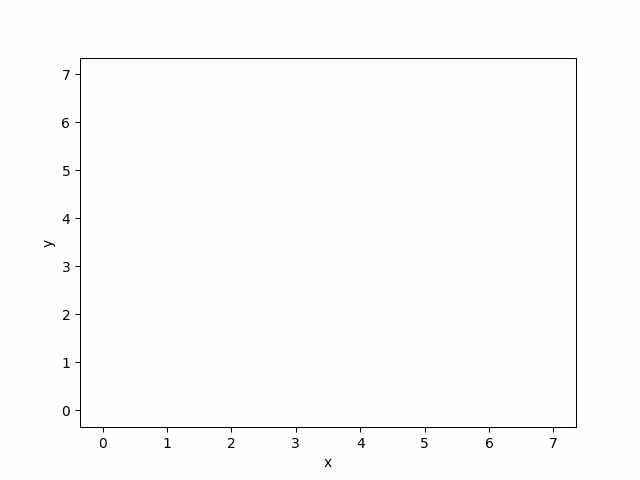

In [10]:
result, vis = is_intersection_with_visualization(test0)
vis.show_gif()

In [28]:
%matplotlib
testa1 = add_sections(5)
%matplotlib inline

Using matplotlib backend: TkAgg


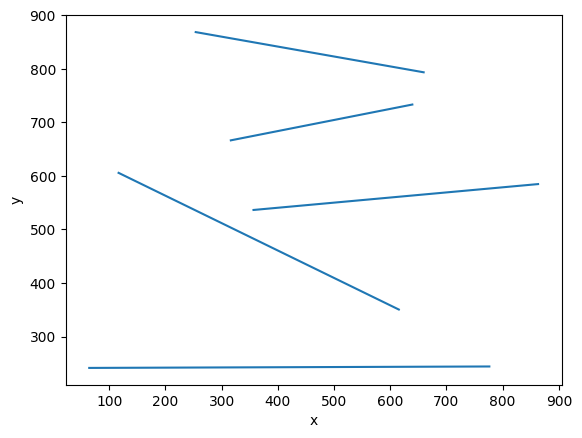

In [29]:
vis = Visualizer()
vis.add_line_segment(testa1)
vis.show()

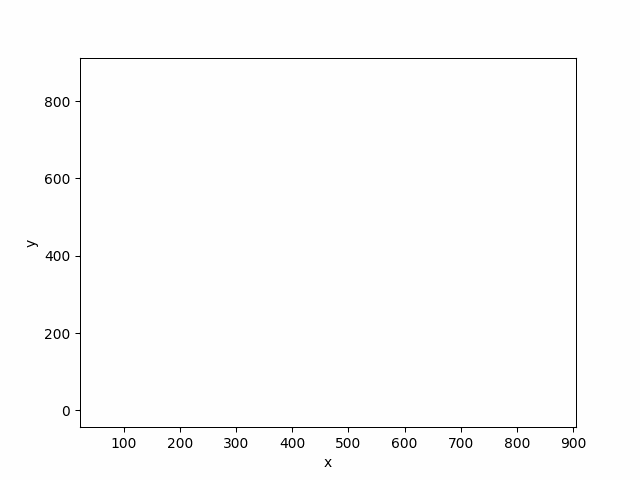

In [32]:
result, vis = is_intersection_with_visualization(testa1)
vis.show_gif()

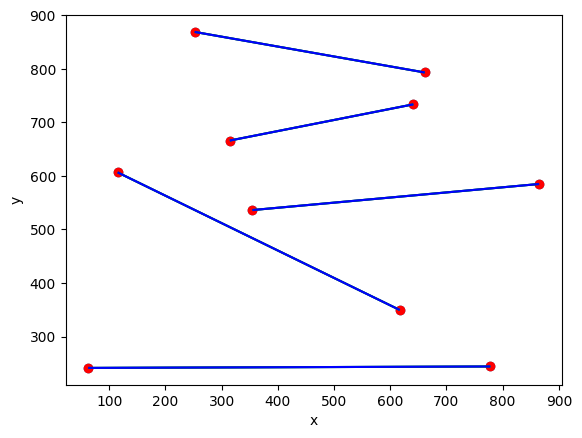

In [33]:
vis.show()

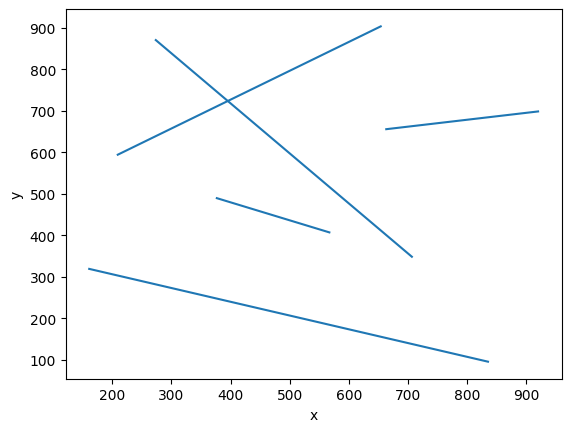

In [35]:
vis = Visualizer()
vis.add_line_segment(testa2)
vis.show()

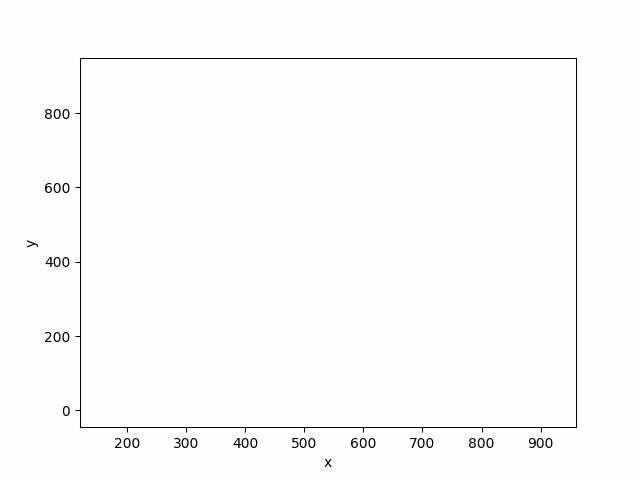

In [38]:
result, vis = is_intersection_with_visualization(testa2)
vis.show_gif()

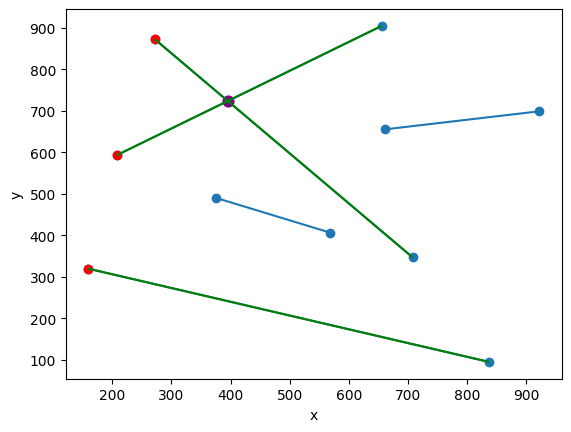

In [39]:
vis.show()

In [41]:
%matplotlib tk
testa3 = add_sections(5)
%matplotlib inline

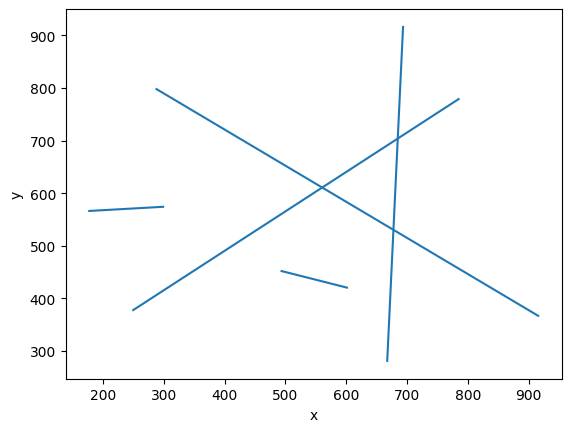

In [42]:
vis = Visualizer()
vis.add_line_segment(testa3)
vis.show()

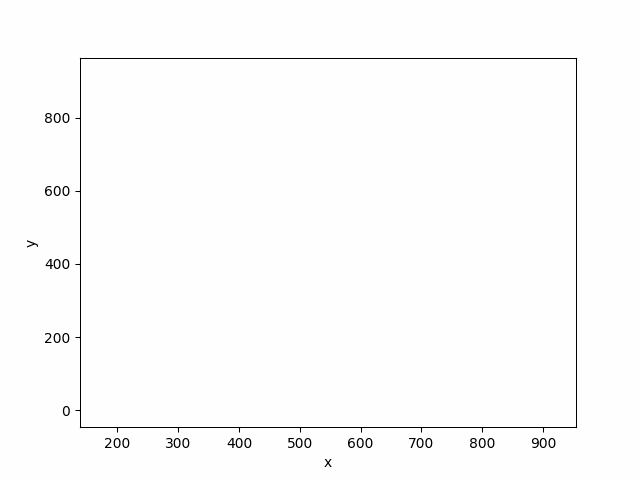

In [43]:
result, vis = is_intersection_with_visualization(testa3)
vis.show_gif()

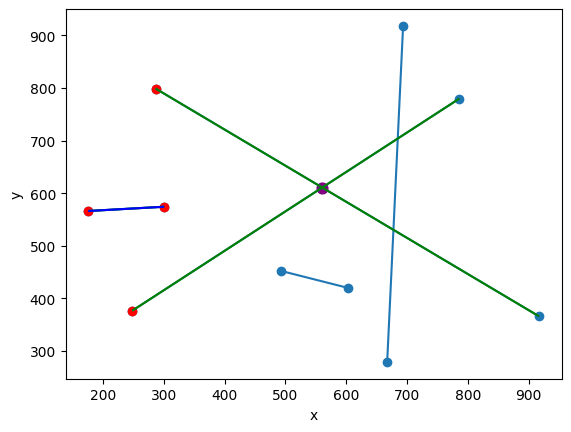

In [44]:
vis.show()

Uzupełnij funkcję ```find_intersections```

In [20]:
def find_intersections(sections):
    """
    Funkcja znajduje wszystkie przecięcia zadanych odcinków
    :param sections: tablica odcinków w postaci krotek ktorek współrzędnych punktów końcowych odcinków
    :return: tablica punktów przecięć w postaci trzyelementowych krotek w których pierwszym elementem są współrzędne danego punktu, a drugim i trzecim indeksy prostych z listy wejściowej, które się przecinają w tym punkcie współrzędnych np.:
    [((x1, y1), id1,id2),
    ((x2, y2), id3, id4),
    ...]
    """

    def CheckForIntersect(queue, crossed, segmentA, segmentB, idxTuple):
        nonlocal index
        if doIntersect(segmentA, segmentB):
            intersection = pointIntersection(segmentA, segmentB)
            if segmentA not in index:
                index[segmentA] = idxTuple[0]
                idx1 = idxTuple[0]
            else:
                idx1 = index[segmentA]
            if segmentB not in index:
                index[segmentB] = idxTuple[1]
                idx2 = idxTuple[1]
            else:
                idx2 = index[segmentB]
            i1 = min(idx1+1, idx2+1)
            i2 = max(idx1+1, idx2+1)
            if (i1,i2) not in crossed:
                queue.put( (intersection, queue.qsize(), 1, (segmentA, segmentB) ) ) 
                crossed[(i1,i2)] =( (intersection, i1, i2 ) ) 
    

    CONST = 0.0001
    crossed = dict()
    queue = prepareData(sections) 
    BTree = None
    index = dict()
    cnt = 1

    while not queue.empty():   
        pointA, pointB, event, segmentNode = queue.get(block = False)

        if event == 0: 
            BTree, pointer = Insert( BTree, (pointA, pointB), segmentNode.idx, pointA[0] )
            
            succNode = Next_Node(BTree, segmentNode.coords, pointA[0] )
            predNode = Prev_Node(BTree, segmentNode.coords, pointA[0] )

            if succNode is not None:
                CheckForIntersect(queue, crossed, segmentNode.coords, succNode.key, (segmentNode.idx, succNode.idx) )

            if predNode is not None:
                CheckForIntersect(queue, crossed, segmentNode.coords, predNode.key, (segmentNode.idx, predNode.idx) )

            

        elif event == 1:
            segmentA = segmentNode[0]
            segmentB = segmentNode[1]
            
            pointerA = Search( BTree, segmentA, pointA[0] - CONST)
            pointerB = Search( BTree, segmentB, pointA[0] - CONST)
        
            
            if pointerA is not  None and pointerB is not None: 

                BTree = Remove(BTree, pointerA.key, pointA[0] - CONST)
                BTree = Remove(BTree, pointerB.key, pointA[0] - CONST)
                
                BTree, pointerA = Insert(BTree, segmentA, 1, pointA[0] + CONST)
                BTree, pointerB = Insert(BTree, segmentB, 2, pointA[0] + CONST)

                if computeValue(pointerB.key[0], pointerB.key[1], pointA[0] + CONST) > computeValue(pointerA.key[0], pointerA.key[1], pointA[0] + CONST):
                    next = Next_Node( BTree, pointerB.key, pointA[0] + CONST)
                    prev = Prev_Node(BTree, pointerA.key, pointA[0] + CONST )

                    if next is not None:                  
                        CheckForIntersect(queue, crossed, pointerB.key, next.key, (pointerB.idx, next.idx) )                    

                    if prev is not None:
                        CheckForIntersect(queue, crossed, pointerA.key, prev.key, (pointerA.idx, prev.idx) )

                else:
                    next = Next_Node( BTree, pointerA.key, pointA[0] + CONST)
                    prev = Prev_Node(BTree, pointerB.key, pointA[0] + CONST)

                    if next is not None:
                        CheckForIntersect(queue, crossed, pointerA.key, next.key, (pointerA.idx, next.idx) )

                    if prev is not None:
                        CheckForIntersect(queue, crossed, pointerB.key, prev.key, (pointerB.idx, prev.idx) )
            
        elif event == 2:

            succNode = Next_Node(BTree, (pointB, pointA), pointA[0] )
            predNode = Prev_Node(BTree, (pointB, pointA), pointA[0] )

            pointer = Search(BTree, (pointB, pointA), pointA[0])

            if pointer is not None:
                BTree = Remove(BTree, pointer.key, pointA[0]) 


            if succNode is not None and predNode is not None:
                CheckForIntersect(queue, crossed, predNode.key, succNode.key, (predNode.idx, succNode.idx))
                


    return list(crossed.values())


In [21]:
Test().runtest(3, find_intersections)

Lab 4, task 3:
	Test 1: WRONG ANSWER
		Output:   [((-0.001674379051665806, -0.007263586832941074), 1, 2), ((0.011526074740254208, 0.00613280129642243), 2, 3), ((0.011860591253227502, -0.018140143229495417), 1, 3), ((0.0223444511307787, 0.017111754849194877), 2, 4), ((0.02265867063122986, -0.02681736354721217), 1, 4)]
		Expected: ['-0.0016743790516658117 -0.007263586832941072 1 2', '0.011526074740254208 0.006132801296422439 2 3', '0.011860591253227505 -0.018140143229495424 1 3', '0.022344451130778698 0.01711175484919488 2 4', '0.022658670631229855 -0.026817363547212168 1 4']
	Test 2: WRONG ANSWER
		Output:   [((0.005806934807635711, -0.016556444720678153), 2, 3), ((0.013332591183346308, -0.01619339562692305), 3, 4), ((0.010025601838031016, -0.020988202988542273), 2, 4)]
		Expected: ['0.005806934807635715 -0.016556444720678153 2 3', '0.010025601838031018 -0.020988202988542273 2 4', '0.013332591183346312 -0.01619339562692305 3 4']
	Test 3: Passed
Result: 1/3
Time: 0.016s


Uzupełnij funkcję ```find_intersections_with_visualization```

In [69]:
def find_intersections_with_visualization(sections):
    """
    Funkcja znajduje wszystkie przecięcia zadanych odcinków i dodatkowo zwraca kolejne kroki w wizualizacji 
    :param sections: tablica odcinków w postaci krotek ktorek współrzędnych punktów końcowych odcinków
    :return: tablica punktów przecięć w postaci trzyelementowych krotek w których pierwszym elementem są współrzędne danego punktu, a drugim i trzecim indeksy prostych z listy wejściowej, które się przecinają w tym punkcie współrzędnych np.:
    [((x1, y1), id1,id2),
    ((x2, y2), id3, id4),
    ...]
    """
    def CheckForIntersectVis(queue, crossed, segmentA, segmentB, idxTuple, vis):
        nonlocal sections
        if doIntersect(segmentA, segmentB):
            intersection = pointIntersection(segmentA, segmentB)
            if segmentA not in index:
                index[segmentA] = idxTuple[0]
                idx1 = idxTuple[0]
            else:
                idx1 = index[segmentA]
            if segmentB not in index:
                index[segmentB] = idxTuple[1]
                idx2 = idxTuple[1]
            else:
                idx2 = index[segmentB]
                
            i1 = min(idx1+1, idx2+1)
            i2 = max(idx1+1, idx2+1)
            if intersection in segmentA or intersection in segmentB:
                liens = vis.add_line_segment( [segmentA, segmentB], color = "orange")
                crossed[(i1,i2)] = (intersection, i1, i2 )
                vis.add_point(intersection, color = "purple",s=130)
                vis.remove_figure(liens)
            elif (i1,i2) not in crossed:
                liens = vis.add_line_segment( [segmentA, segmentB], color = "orange")
                queue.put( (intersection, queue.qsize(), 1, (segmentA, segmentB) ) ) 
                crossed[(i1,i2)] = (intersection, i1, i2 )
                vis.add_point(intersection, color = "purple",s=60)
                vis.remove_figure(liens)
    
    
    vis = Visualizer()
    CONST = 0.0001
    points = []
    for i in sections:
        points.append(i[0])
        points.append(i[1])

    vis.add_point(points, color = "blue")
    vis.add_line_segment(sections)
    crossed = dict()
    queue = prepareData(sections) 
    BTree = None
    index = dict()

    while not queue.empty():

        pointA, pointB, event, segmentNode = queue.get(block = False)
        line = vis.add_line( ((pointA[0], 0), (pointA[0], 0.1)), color = "red" )
        if event == 0: 
            BTree, pointer = Insert( BTree, (pointA, pointB), segmentNode.idx, pointA[0] )
            
            vis.add_line_segment( ( pointA, pointB), color = "green" )
            vis.add_point(pointA,color="red")
            
            succNode = Next_Node(BTree, segmentNode.coords, pointA[0] )
            predNode = Prev_Node(BTree, segmentNode.coords, pointA[0] )

            if succNode is not None:
                CheckForIntersectVis(queue, crossed, segmentNode.coords, succNode.key, (segmentNode.idx, succNode.idx), vis )

            if predNode is not None:
                CheckForIntersectVis(queue, crossed, segmentNode.coords, predNode.key, (segmentNode.idx, predNode.idx), vis )

            

        elif event == 1:
            segmentA = segmentNode[0]
            segmentB = segmentNode[1]
            
            pointerA = Search( BTree, segmentA, pointA[0] - CONST)
            pointerB = Search( BTree, segmentB, pointA[0] - CONST)
        
            
            if pointerA is not  None and pointerB is not None: 

                BTree = Remove(BTree, pointerA.key, pointA[0] - CONST)
                BTree = Remove(BTree, pointerB.key, pointA[0] - CONST)
                
                BTree, pointerA = Insert(BTree, segmentA, 1, pointA[0] + CONST)
                BTree, pointerB = Insert(BTree, segmentB, 2, pointA[0] + CONST)

                if computeValue(pointerB.key[0], pointerB.key[1], pointA[0] + CONST) > computeValue(pointerA.key[0], pointerA.key[1], pointA[0] + CONST):
                    next = Next_Node( BTree, pointerB.key, pointA[0] + CONST)
                    prev = Prev_Node(BTree, pointerA.key, pointA[0] + CONST )

                    if next is not None:                  
                        CheckForIntersectVis(queue, crossed, pointerB.key, next.key, (pointerB.idx, next.idx), vis )                    

                    if prev is not None:
                        CheckForIntersectVis(queue, crossed, pointerA.key, prev.key, (pointerA.idx, prev.idx), vis )

                else:
                    next = Next_Node( BTree, pointerA.key, pointA[0] + CONST)
                    prev = Prev_Node(BTree, pointerB.key, pointA[0] + CONST)

                    if next is not None:
                        CheckForIntersectVis(queue, crossed, pointerA.key, next.key, (pointerA.idx, next.idx), vis )

                    if prev is not None:
                        CheckForIntersectVis(queue, crossed, pointerB.key, prev.key, (pointerB.idx, prev.idx), vis )
            
        elif event == 2:

            succNode = Next_Node(BTree, (pointB, pointA), pointA[0] )
            predNode = Prev_Node(BTree, (pointB, pointA), pointA[0] )

            pointer = Search(BTree, (pointB, pointA), pointA[0])
            vis.add_line_segment( (pointB, pointA), color = "blue")
            vis.add_point(pointA,color="red")

            if pointer is not None:
                BTree = Remove(BTree, pointer.key, pointA[0]) 


            if succNode is not None and predNode is not None:
                CheckForIntersectVis(queue, crossed, predNode.key, succNode.key, (predNode.idx, succNode.idx), vis)
                
        vis.remove_figure(line)


    return list(crossed.values()), vis

In [59]:
test0 = [((0,0),(1,1)),((0,2),(2,0)),((7,7),(3,3))]

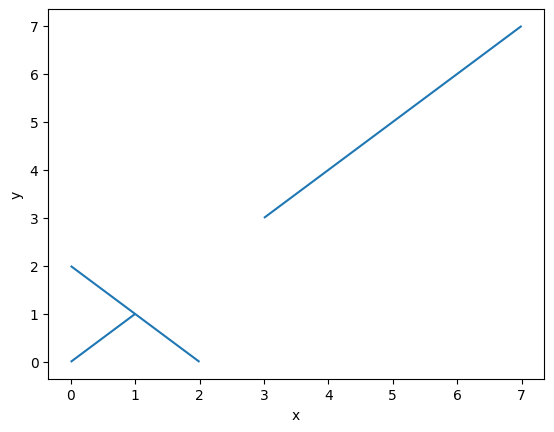

In [70]:
vis = Visualizer()
vis.add_line_segment(test0)
vis.show()

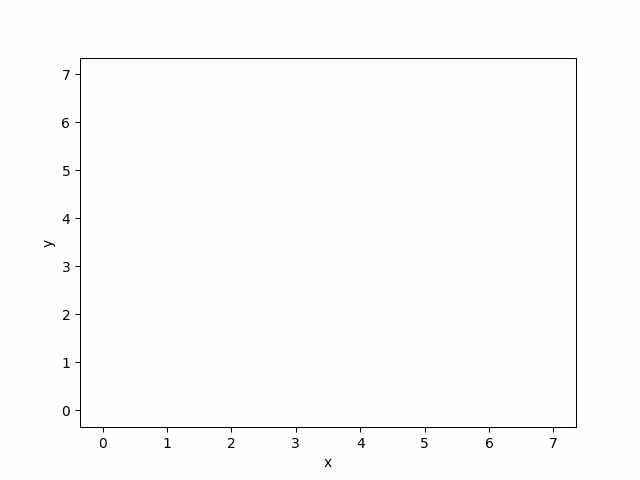

In [71]:
res,visr = find_intersections_with_visualization(test0)
visr.show_gif()

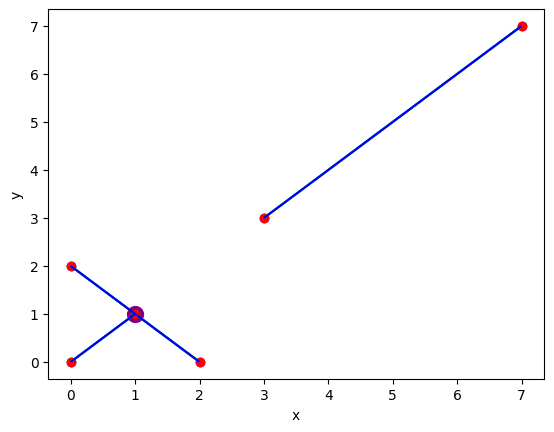

In [72]:
visr.show()

In [49]:
%matplotlib
test = add_sections(6)
%matplotlib inline

Using matplotlib backend: TkAgg


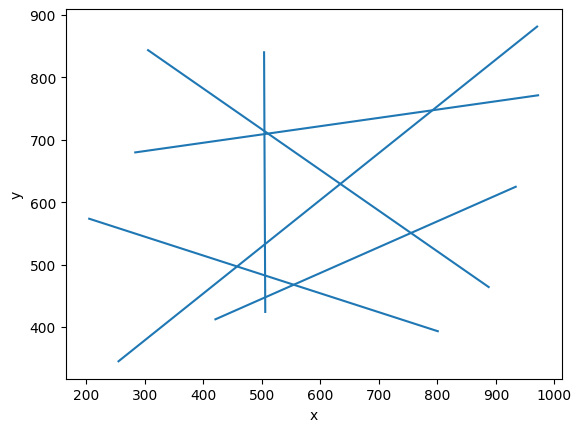

In [51]:
vis = Visualizer()
vis.add_line_segment(test)
vis.show()

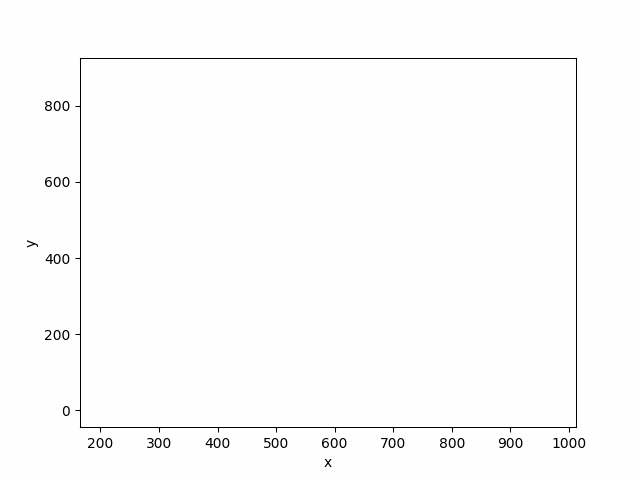

In [53]:
res,visr = find_intersections_with_visualization(test)
visr.show_gif()

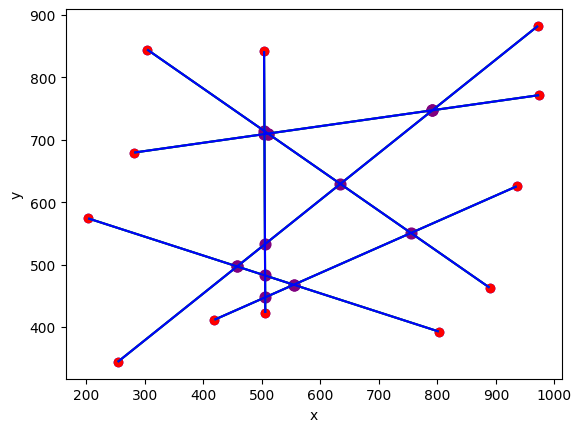

In [54]:
visr.show()

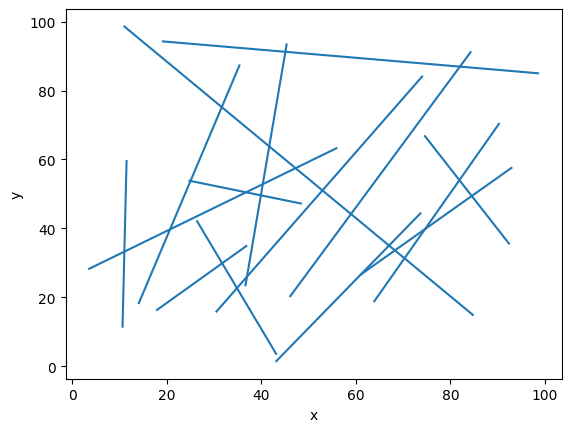

In [48]:
test2 = generate_uniform_sections(100,100,15)
vistmp = Visualizer()
vistmp.add_line_segment(test2)
vistmp.show()

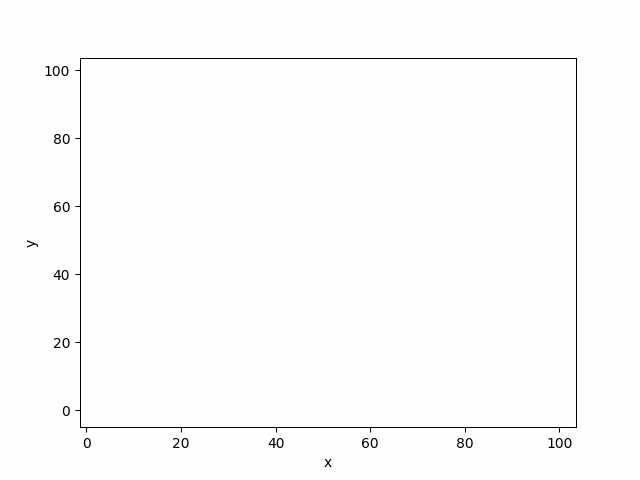

In [49]:
res,visr = find_intersections_with_visualization(test2)
visr.show_gif(interval=300)

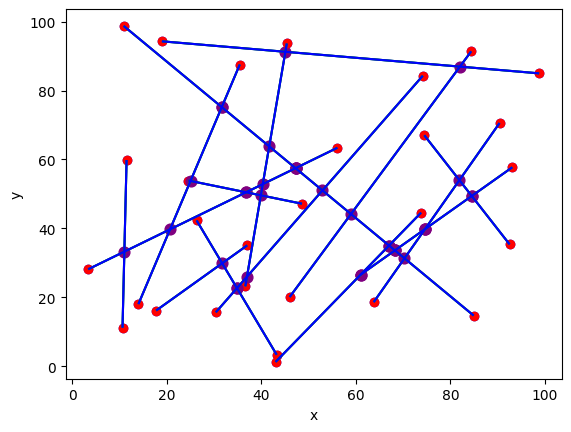

In [50]:
visr.show()

In [117]:
%matplotlib tk
testb1 = add_sections(5)
%matplotlib inline

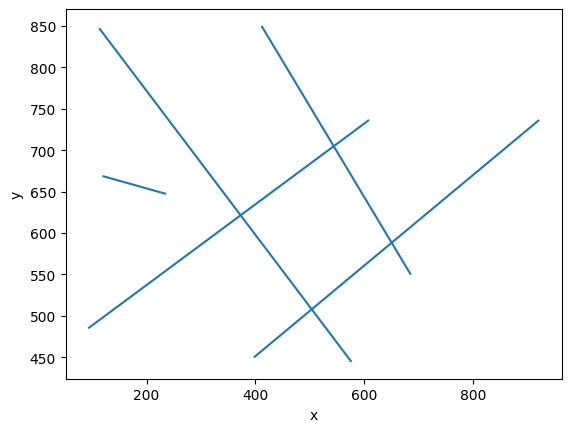

In [118]:
vis = Visualizer()
vis.add_line_segment(testb1)
vis.show()

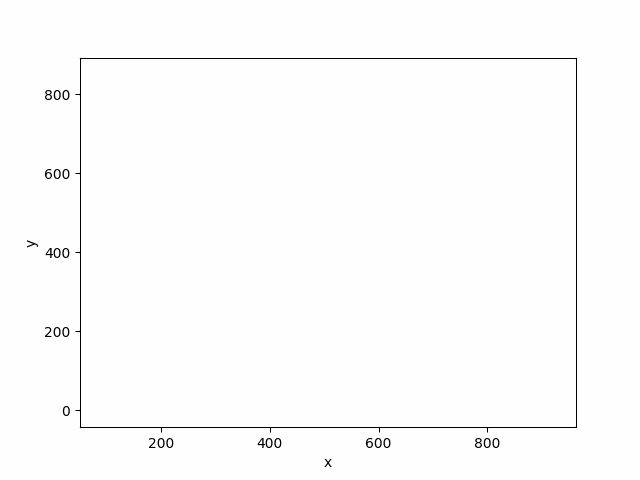

In [119]:
result, vis = find_intersections_with_visualization(testb1)
vis.show_gif()

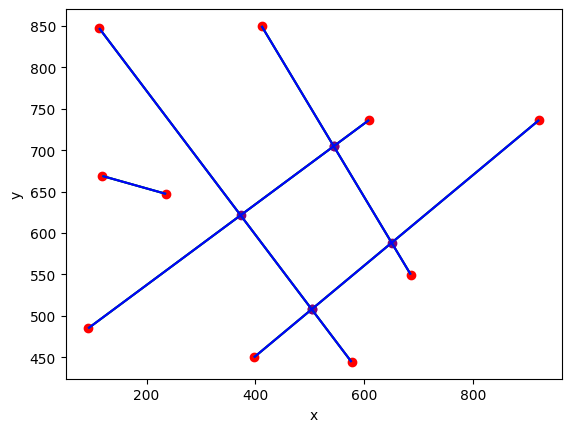

In [120]:
vis.show()

In [59]:
testb1 = [((112.90322580645162, 874.4588744588744), (866.9354838709678, 479.43722943722946)), ((88.70967741935485, 568.7229437229438), (913.3064516129032, 833.8744588744589)), ((221.7741935483871, 863.6363636363636), (518.1451612903226, 425.32467532467535)), ((286.2903225806451, 514.6103896103896), (883.0645161290322, 760.8225108225108)), ((669.3548387096774, 831.1688311688312), (816.5322580645162, 668.8311688311688)), ((379.0322580645162, 411.79653679653677), (933.4677419354839, 606.6017316017317)), ((685.483870967742, 400.97402597402595), (872.983870967742, 506.4935064935065)), ((209.6774193548387, 168.2900432900433), (925.4032258064517, 357.68398268398266)), ((112.90322580645162, 457.7922077922078), (856.8548387096774, 38.4199134199134)), ((423.38709677419354, 133.11688311688312), (556.4516129032259, 100.64935064935062))]

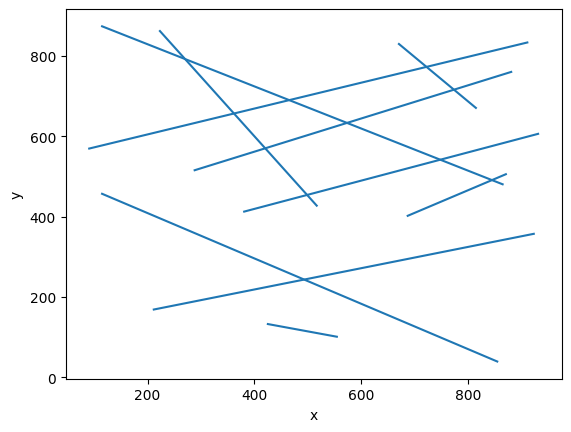

In [60]:
vis = Visualizer()
vis.add_line_segment(testb1)
vis.show()

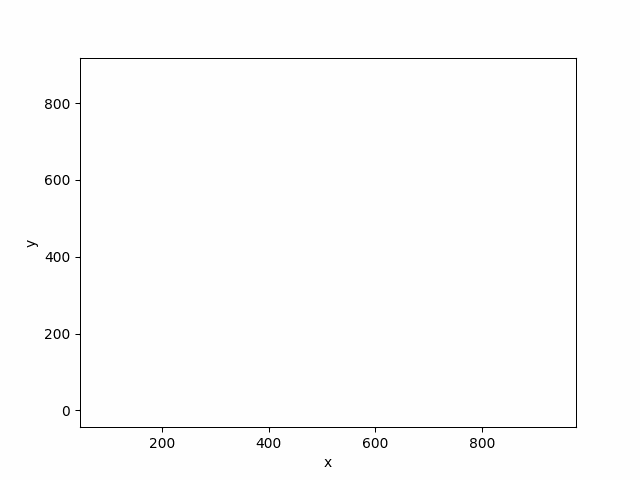

In [61]:
result, vis = find_intersections_with_visualization(testb1)
vis.show_gif()

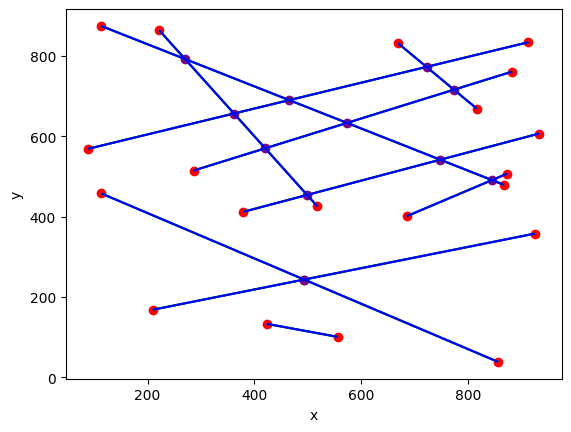

In [124]:
vis.show()

Brute-Force

In [25]:
def Brute_force(sections):
    result = []
    for i in range(len(sections)):
        for j in range(i+1,len(sections)):
            if doIntersect(sections[i],sections[j]):
                result.append((pointIntersection(sections[i],sections[j]),i+1,j+1))

    return result

Porównanie czasowe algorytmów

In [28]:
sections1000 = generate_uniform_sections(10000,10000,1000)

In [29]:
import time
start = time.time()
res1 = find_intersections(sections1000)
end = time.time()
print(end - start)
start = time.time()
res2 = Brute_force(sections1000)
end = time.time()
print(end-start)
print(res1.sort() == res2.sort())


0.1406407356262207
2.2222368717193604
True


In [33]:
sections3000 = generate_uniform_sections(10000,10000,3000)

In [34]:
import time
start = time.time()
res1 = find_intersections(sections3000)
end = time.time()
print(end - start)
start = time.time()
res2 = Brute_force(sections3000)
end = time.time()
print(end-start)
print(res1.sort() == res2.sort())

0.42867207527160645
27.481390476226807
True


In [36]:
sections6000 = generate_uniform_sections(10000,10000,6000)

In [37]:
import time
start = time.time()
res1 = find_intersections(sections6000)
end = time.time()
print(end - start)
start = time.time()
res2 = Brute_force(sections6000)
end = time.time()
print(end-start)
print(res1.sort() == res2.sort())

1.029695987701416
79.82372999191284
True


In [30]:
sections10000 = generate_uniform_sections(10000,10000,10000)

In [32]:
import time
start = time.time()
res1 = find_intersections(sections10000)
end = time.time()
print(end - start)
start = time.time()
res2 = Brute_force(sections10000)
end = time.time()
print(end-start)
print(res1.sort() == res2.sort())

1.751575231552124
221.5074737071991
True


### Czy konieczne były zmiany w strukturze zdarzeń. Jeśli tak, to jakie? Czy w przypadku obu algorytmów konieczne są takie same struktury zdarzeń?
### Odpowiedź uzasadnij. 

Odpowiedź here

### Jak obsługiwane są zdarzenia początku odcinka, końca odcinka i przecięcia odcinków z uwzględnianiem wybranych struktur danych?

Odpowiedź here

### Samemu zaprojektuj test, który uwzględnia taki układ odcinków, przy którym pewne przecięcia będą wykrywane więcej niż jeden raz

testb1 rozważa ten przypadek

Odpowiedź here

### Zadanie dodatkowe
Zaimplementuj inną strukturę stanu. Opisz ją w sprawozdaniu. Porównaj efektywność algorytmu dla obu struktur robiąc testy na odpowiednio dużych zestawach odcinków.